# plotly week 1 challenge 

## Elizaveta Titova

### Group 1 challenge 

In [2]:
import pandas as pd
import plotly.express as px
import plotly.io as pio # installing this after ive done the challenges so the pictures of graphs will show up in github link)

In [3]:
df = pd.read_csv("AB_NYC_2019.csv")
df.head(3)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365


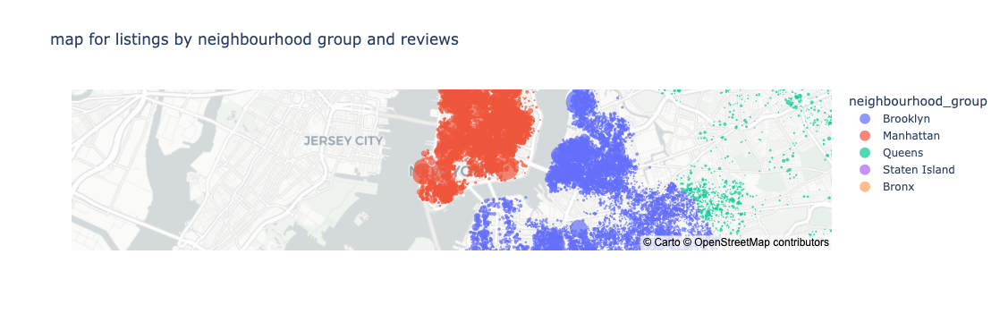

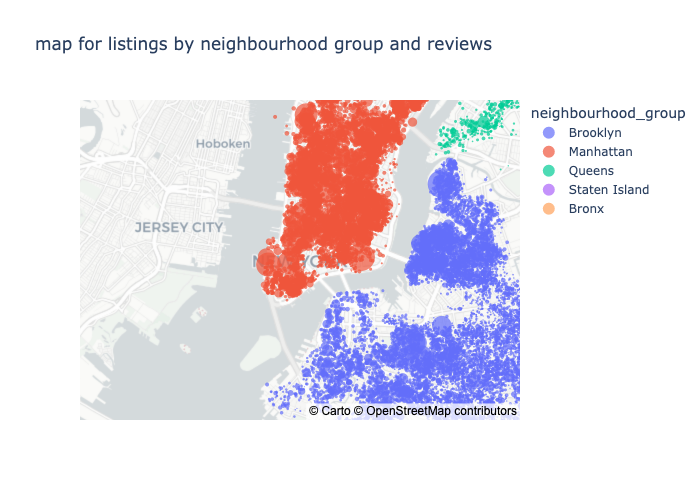

In [4]:
#Use scatter_mapbox to plot latitude and longitude with colors representing neighborhood groups and size based on price.
fig = px.scatter_mapbox(df, 
                        lat = 'latitude', 
                        lon= 'longitude', 
                        color = 'neighbourhood_group', 
                        size = 'price',
                        title = 'map for listings by neighbourhood group and reviews',
                        mapbox_style = "carto-positron",
                        center = {'lat':40.7128, 'lon':-74.0060},
                        zoom = 11
                       )
fig.show()
pio.show(fig, renderer="png")

In [6]:
#In a new cell, Filter the dataset to include only listings from Queens.
df_queens = df[df['neighbourhood_group']=='Queens']



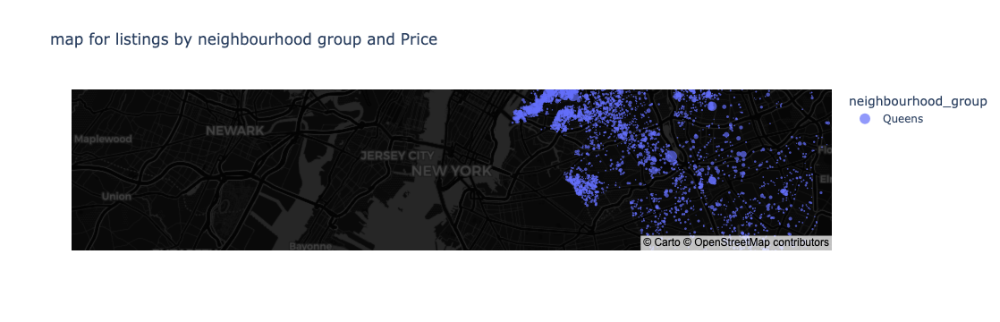

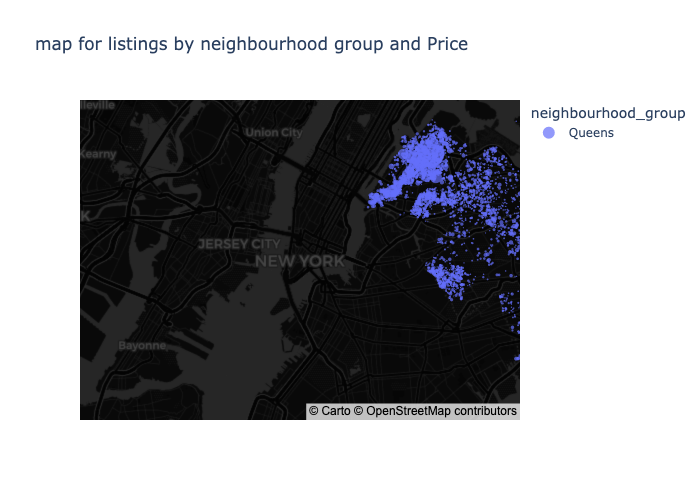

In [7]:
#In a new cell, Generate a scatter mapbox plot for listings in Queens, using neighbourhood for color and price for size.
fig = px.scatter_mapbox(df_queens, 
                        lat = 'latitude', 
                        lon= 'longitude', 
                        color = 'neighbourhood_group', 
                        size = 'price',
                        title = 'map for listings by neighbourhood group and Price',
                        mapbox_style = "carto-darkmatter",
                        center = {'lat':40.7128, 'lon':-74.0060},
                        zoom = 10
                       )
fig.show()
pio.show(fig, renderer="png")

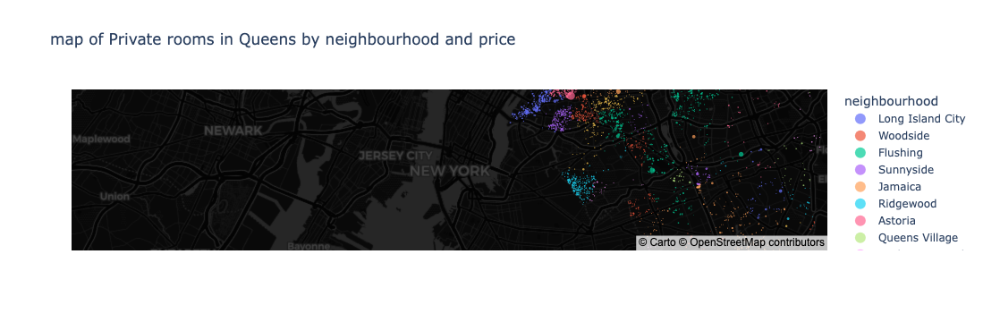

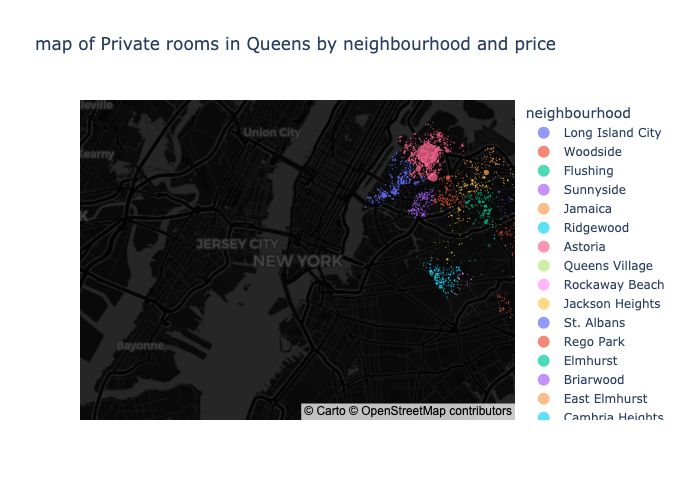

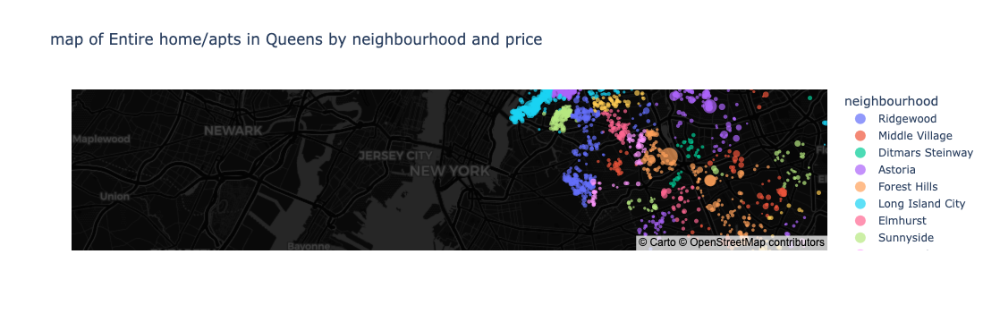

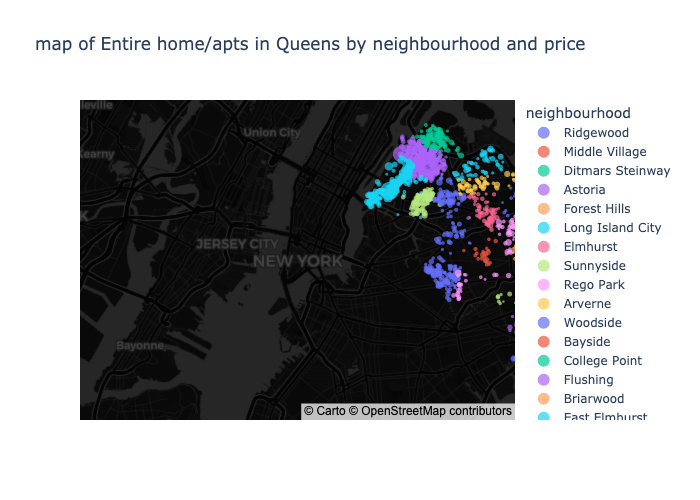

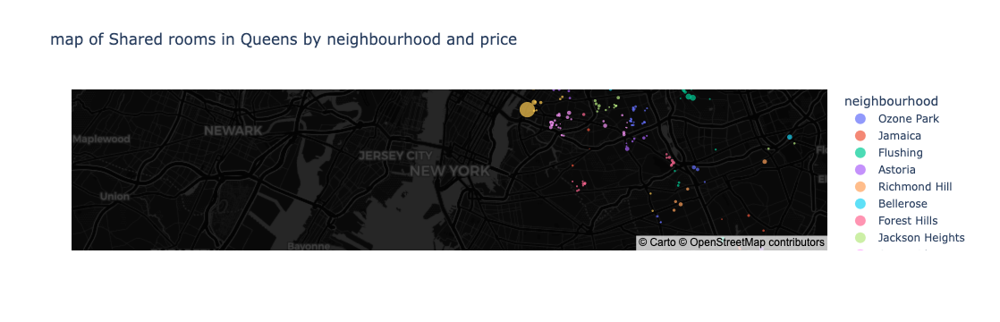

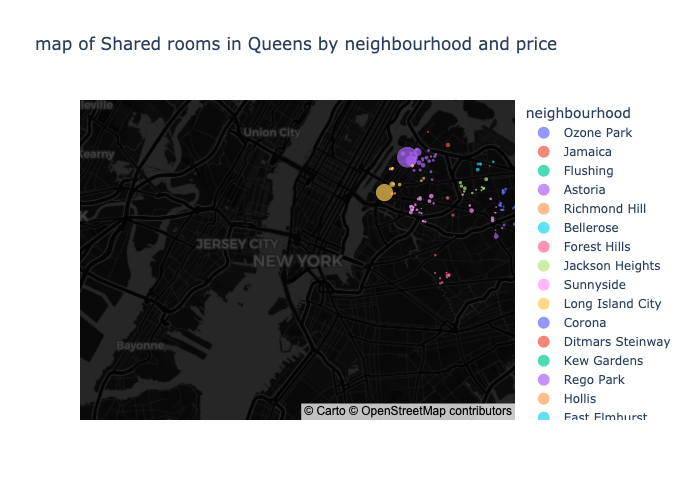

In [8]:
#Define a function to create a map for each room type, filtering the data by room type and plotting the map.
def create_map_for_room_type(room_type):
    df_room_type = df_queens[df_queens['room_type']==room_type]
    
    fig = px.scatter_mapbox(
        df_room_type,
        lat='latitude',
        lon='longitude',
        color = 'neighbourhood',
        size = 'price',
        hover_name = 'name',
        hover_data = {
            'price':True,
            'room_type':True,
            'number_of_reviews':True,
            'availability_365': True
        },
        title = f'map of {room_type}s in Queens by neighbourhood and price',
        mapbox_style = "carto-darkmatter",
        center = {'lat':40.7128, 'lon':-74.0060},
        zoom = 10,
        size_max = 15
    )
    fig.show()
    pio.show(fig, renderer="png")
#Extract unique room types from the dataset and loop through them to generate individual maps.
room_types = df_queens['room_type'].unique()

for room_type in room_types:
    create_map_for_room_type(room_type)

In [9]:
# Filter dataset for Queens and shared rooms
df_shared_rooms = df[(df['neighbourhood_group'] == 'Queens') & (df['room_type'] == 'Shared room')]

In [10]:
# Categorize Listings by Number of Reviews, Create bins to categorize listings by the number of reviews (e.g., 0-10, 11-50, 51+ reviews).
# Define bins and labels for categorizing the reviews
bins = [0, 10, 50, float('inf')] 
labels = ['0-10 reviews', '11-50 reviews', '51+ reviews']

df_shared_rooms.loc[:, 'review_category'] = pd.cut(
    df_shared_rooms['number_of_reviews'], 
    bins=bins, 
    labels=labels, 
    include_lowest=True
)


/var/folders/th/h5wysqq52w99x0m1_y3_zsbm0000gn/T/ipykernel_60528/800602662.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



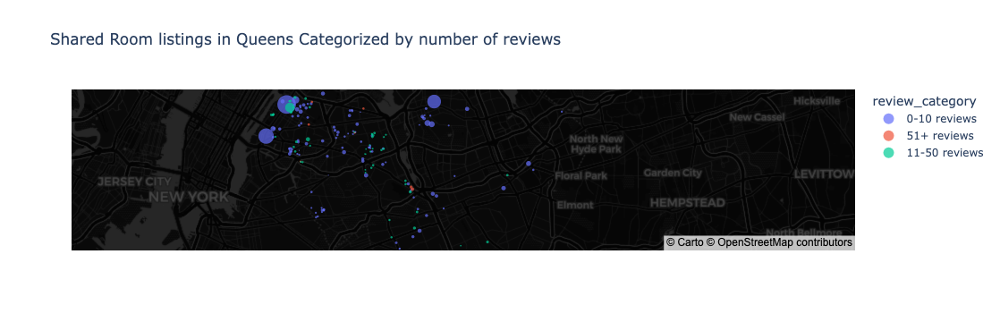

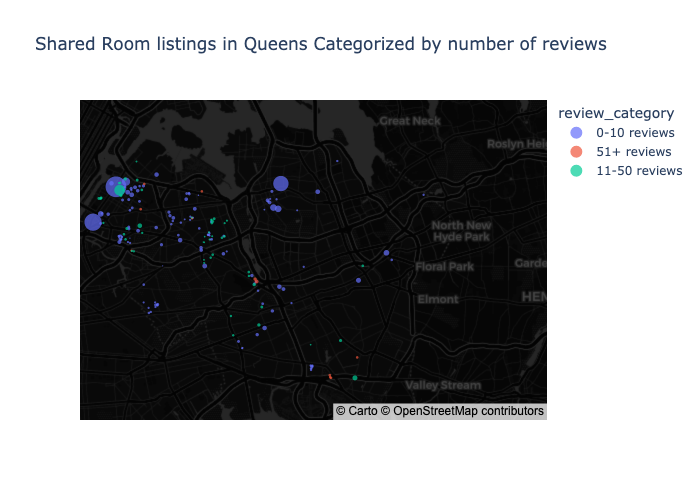

In [12]:
# Define a custom color palette for the categories based on the number of reviews. Plot the filtered dataset of shared rooms using scatter_mapbox, coloring by the review categories and adjusting marker size by price.
fig = px.scatter_mapbox(
    df_shared_rooms,
    lat='latitude',
    lon='longitude',
    color='review_category',  
    size = 'price',  
    hover_name='name',
    hover_data={
        'price':True,
        'number_of_reviews':True,
        'availability_365':True
    },
    title='Shared Room listings in Queens Categorized by number of reviews',
    mapbox_style="carto-darkmatter",     
    center={'lat': 40.7282, 'lon': -73.7949},   
    zoom=10,
    size_max=15
        )
fig.show()
pio.show(fig, renderer="png")

### Group 2 challenge 

In [14]:
df2 = pd.read_csv("S&P.csv", header=1) 
df2.head(3)

,Year,S&P 500,Dividends,Dividend Yield,T.Bond rate,Return on bond,Aaa Bond Rate,Return on Aaa,Baa Bond Rate,Return on Baa,Returns on Real Estate,Unnamed: 11
0,1927.0,17.66,0.62,3.50%,3.17%,NaN,4.46%,NaN,5.32%,NaN,NaN,NaN
1,1928.0,24.35,1.05,4.30%,3.45%,0.84%,4.61%,3.28%,5.60%,3.22%,1.49%,NaN
2,1929.0,21.45,0.88,4.10%,3.36%,4.20%,4.67%,4.14%,5.95%,3.02%,-2.06%,NaN


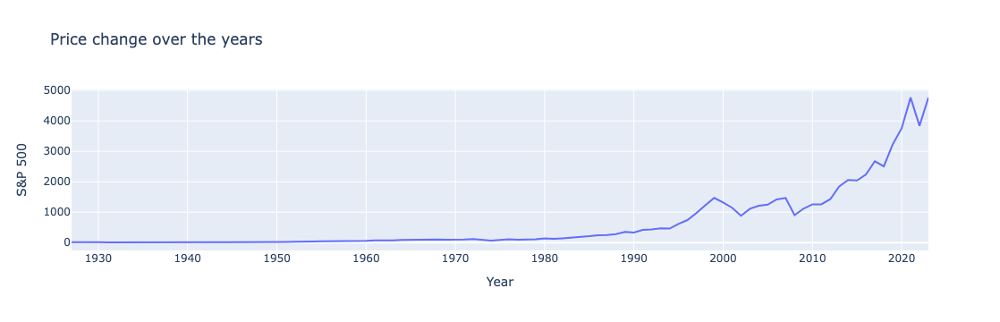

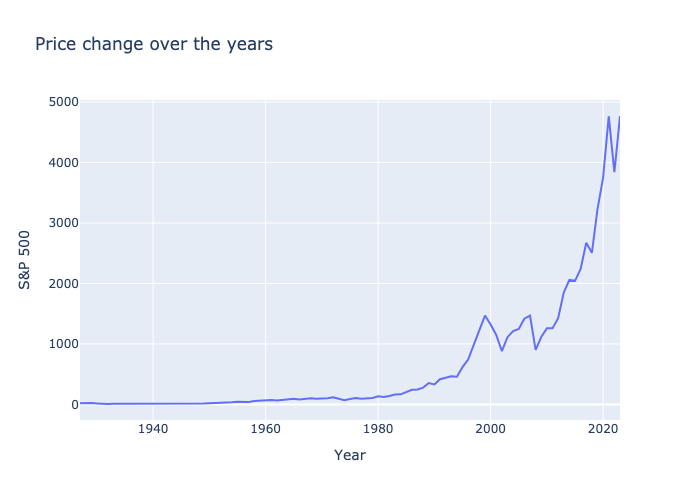

In [15]:
# Create a “line chart” using the px.line function showing how the price of S&P 500 has changed over the years
fig = px.line(df2,
              x="Year",
              y="S&P 500",
              title="Price change over the years")
fig.show()
pio.show(fig, renderer="png")

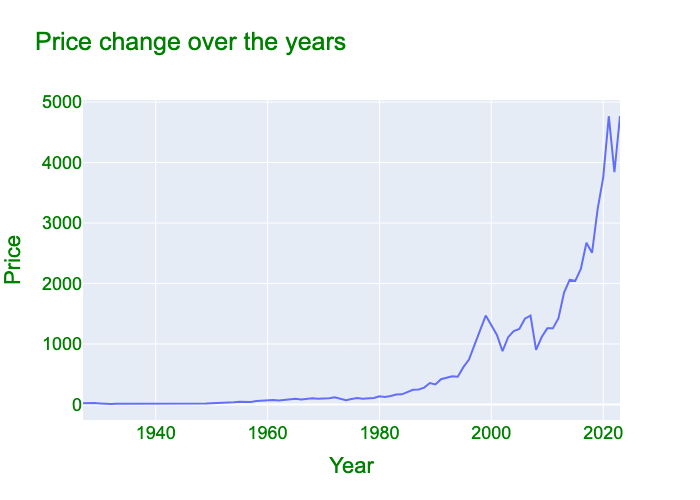

In [16]:
# Customize the chart appearance by changing the line color, the size of the text and the font using fig.update_layout() and fig.update_traces()
fig.update_layout(
    title="Price change over the years",
    xaxis_title="Year",
    yaxis_title="Price",
    font=dict(
        family="Arial, sans-serif",             
        size=18,
        color="green"
    )
)
pio.show(fig, renderer="png")

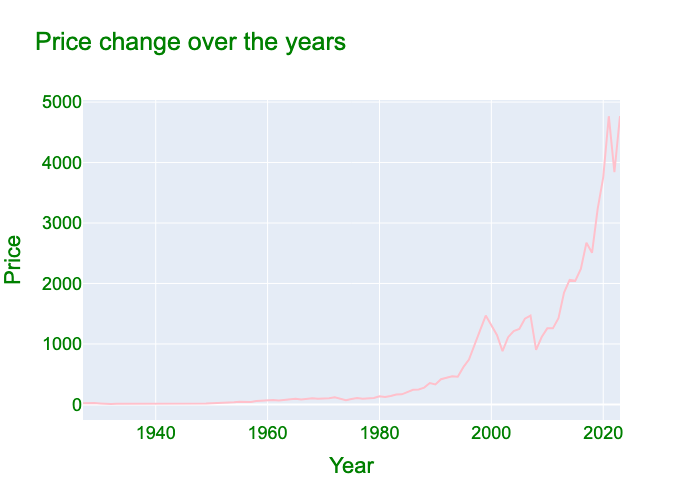

In [17]:
fig.update_traces(line_color="pink",
                  selector=dict(type='scatter') 
                 )
pio.show(fig, renderer="png")

In [18]:
# Add an annotation including a hovertext to the chart using fig.add_annotation()
fig.layout.annotations = []  # Clear existing annotations


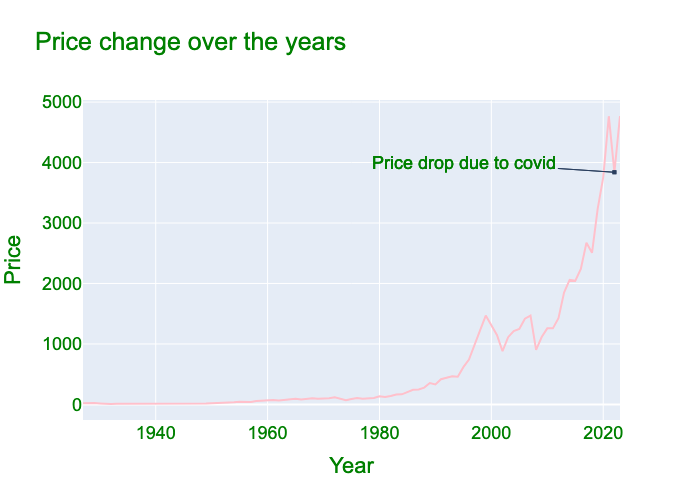

In [20]:
fig.add_annotation(
    x="2022",
    y=3839.5,
    text="Price drop due to covid",
    showarrow=True,
    arrowhead=7,
    ax=-150,
    ay=-10,
    hovertext="covid 19 was a pandemic lasting from 2020 until 2023 <br> This is me creating a second line",
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="black",
        font=dict(
            color="black"
        )
    )
)
pio.show(fig, renderer="png")

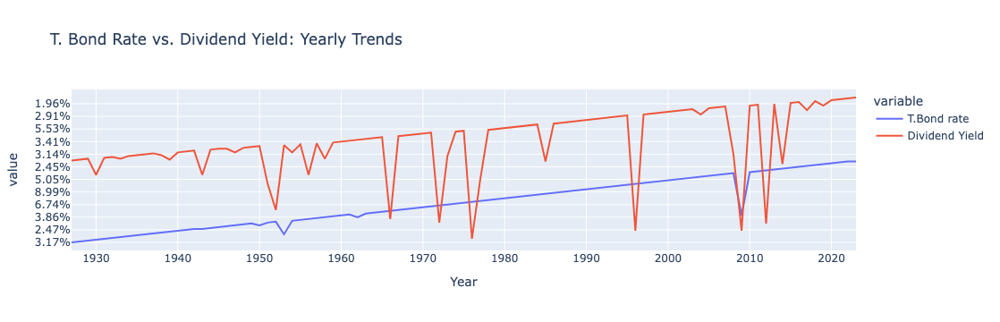

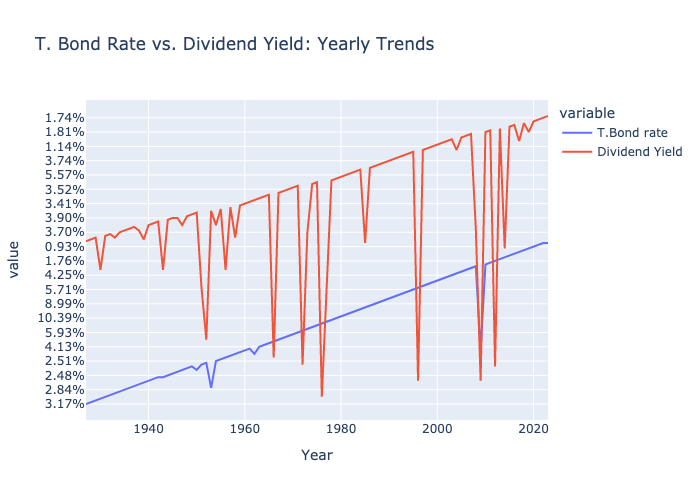

In [21]:
# Create another line chart with two new values (make sure if they are percentages that both of your columns are percentages).
fig = px.line(df2,
              x="Year",
              y=["T.Bond rate", "Dividend Yield"],
              title="T. Bond Rate vs. Dividend Yield: Yearly Trends")
fig.show()
pio.show(fig, renderer="png")

### Group 3 challenge

In [22]:
df3=pd.read_csv("country_wise_latest.csv")
df3.head(3)

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa


In [23]:
df3.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


In [24]:
df3.isnull().sum()

Country/Region            0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
Confirmed last week       0
1 week change             0
1 week % increase         0
WHO Region                0
dtype: int64

In [25]:
df3.drop_duplicates()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,West Bank and Gaza,10621,78,3752,6791,152,2,0,0.73,35.33,2.08,8916,1705,19.12,Eastern Mediterranean
183,Western Sahara,10,1,8,1,0,0,0,10.00,80.00,12.50,10,0,0.00,Africa
184,Yemen,1691,483,833,375,10,4,36,28.56,49.26,57.98,1619,72,4.45,Eastern Mediterranean
185,Zambia,4552,140,2815,1597,71,1,465,3.08,61.84,4.97,3326,1226,36.86,Africa


### In a new code cell, create and show a scatter plot.
### Use the px.scatter() function to generate a scatter plot.
### X-Axis: Assign the 'Confirmed' column to the x-axis.
### Y-Axis: Assign the 'Deaths' column to the y-axis.
### Title: Add a descriptive title.
### Call the show() method to display the plot.


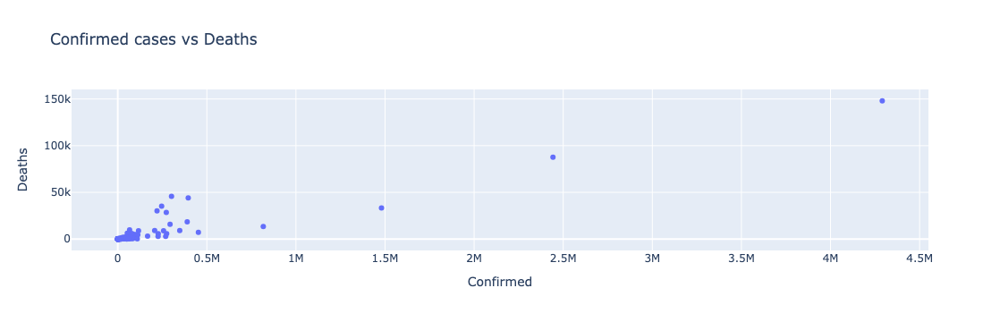

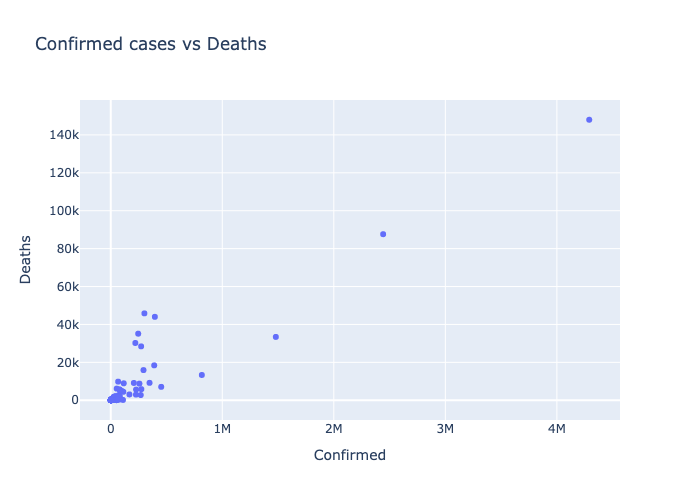

In [26]:
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               title='Confirmed cases vs Deaths'
              )
fig.show()
pio.show(fig, renderer="png")

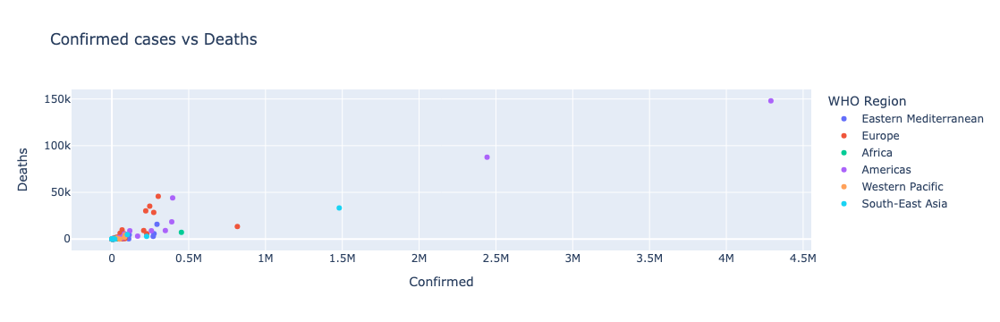

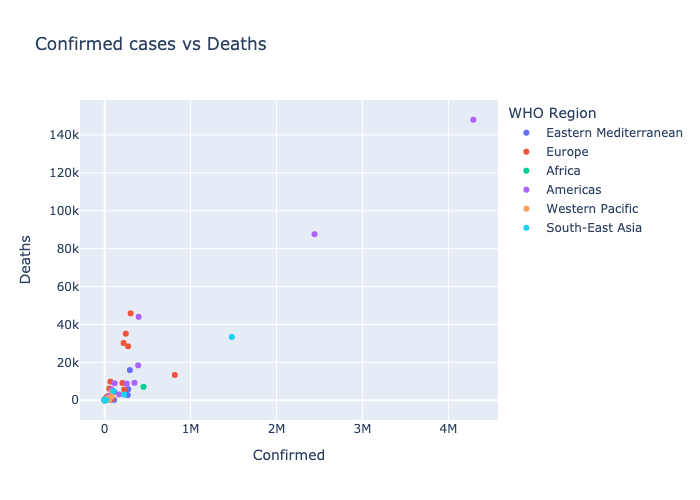

In [27]:
# In a new code cell, let’s add color to the scatter plot by modifying the px.scatter() function to include color argument, specifying the column you want to color (e.g., ‘WHO Region’) and then display the plot.
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               color='WHO Region',
               title='Confirmed cases vs Deaths'
              )
fig.show()
pio.show(fig, renderer="png")

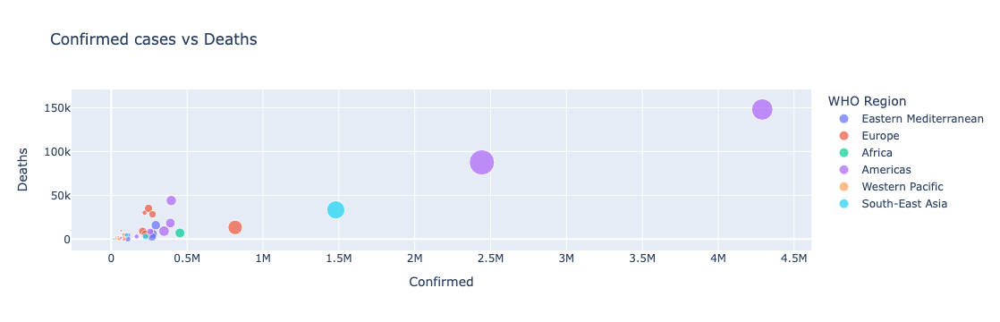

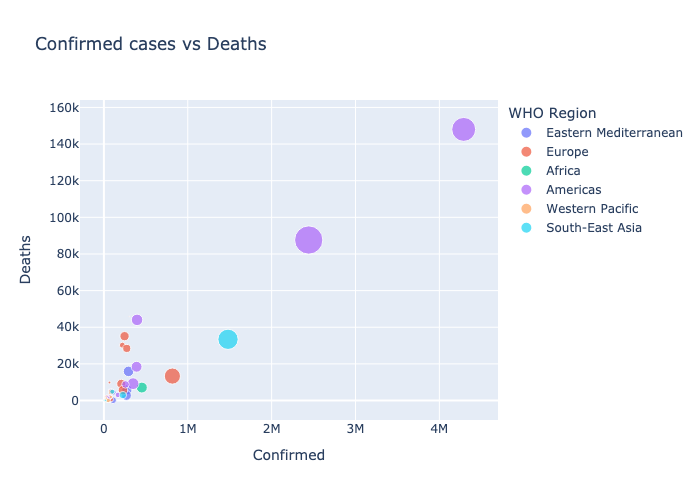

In [28]:
# In a new code cell, let’s add size to the scatter plot
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               color='WHO Region',
               size='Recovered',
               title='Confirmed cases vs Deaths'
              )
fig.show()
pio.show(fig, renderer="png")

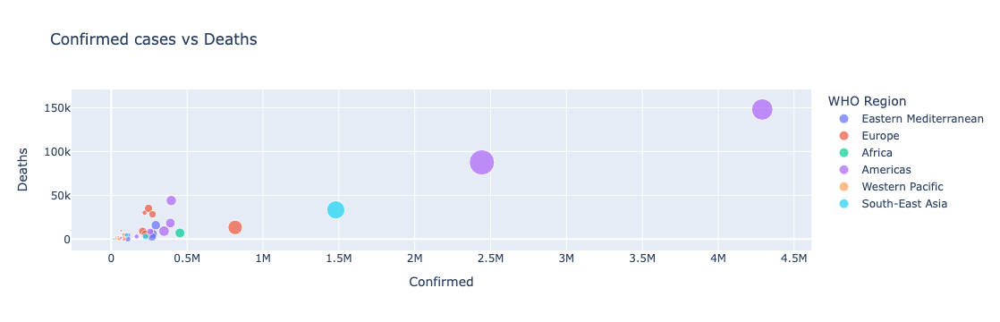

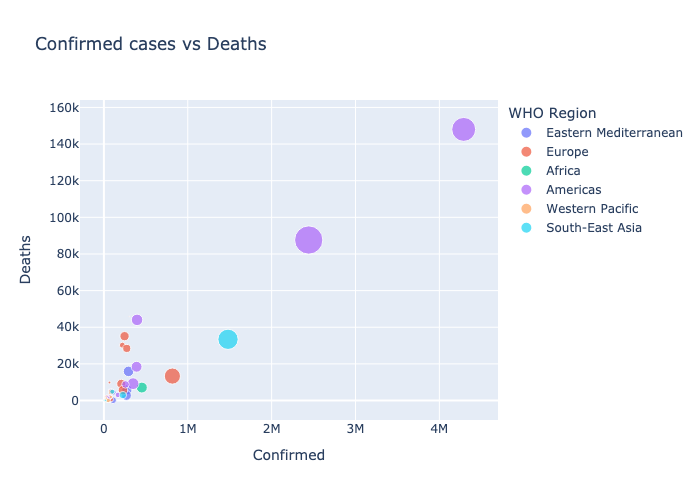

In [29]:
# In a new code cell, add hover information
# Using hover to display the information like Country/Region, Active cases, and New cases.
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               color='WHO Region',
               size='Recovered',
               title='Confirmed cases vs Deaths',
               hover_data=['Country/Region','Active','New cases']
              )
fig.show()
pio.show(fig, renderer="png")

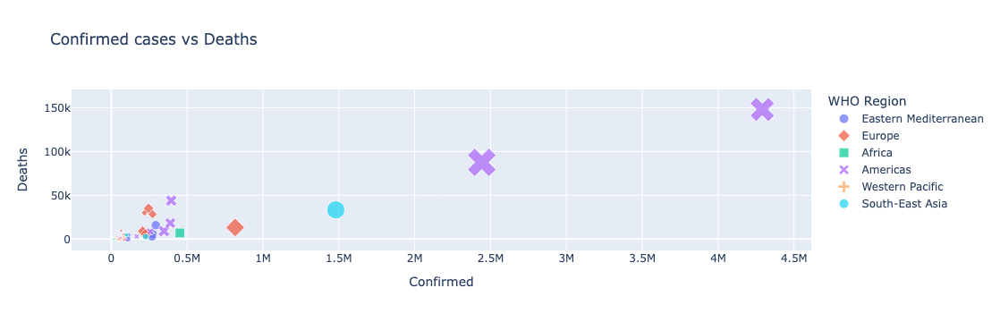

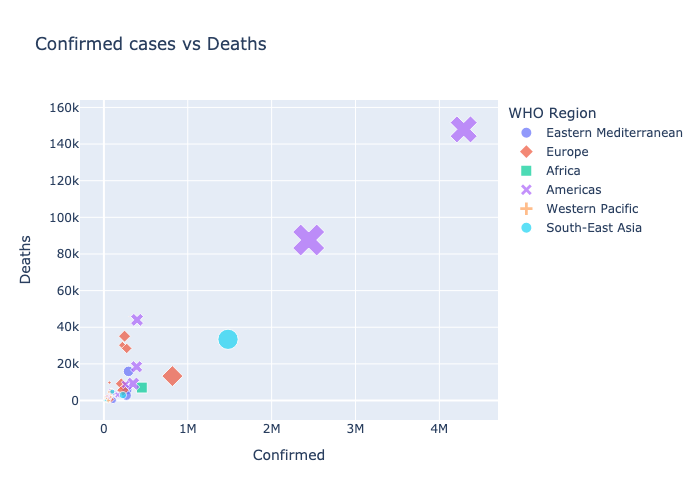

In [30]:
# In a new code cell, let’s add symbol to the scatter plot.
# Use symbol mapping to map different marker symbols for WHO Region, which will make the plot even more visually distinct.
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               color='WHO Region',
               size='Recovered',
               title='Confirmed cases vs Deaths',
               hover_data=['Country/Region','Active','New cases'],
               symbol='WHO Region'
              )
fig.show()
pio.show(fig, renderer="png")

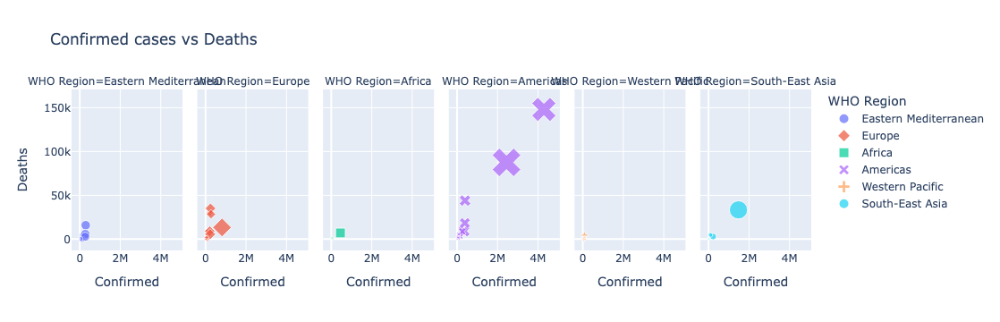

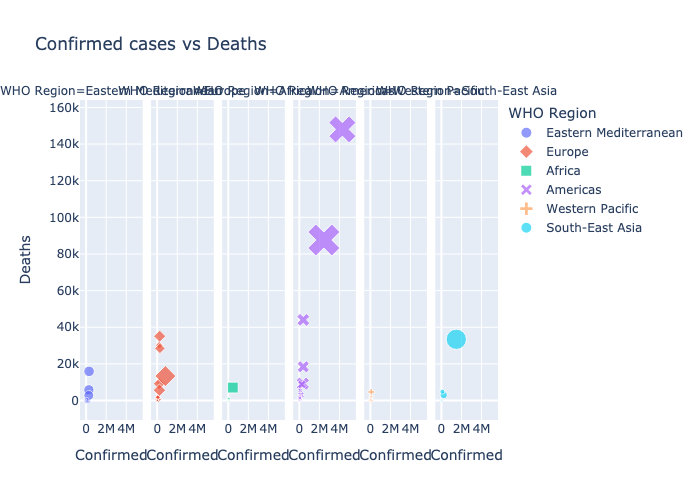

In [31]:
# In a new code cell, add facet_col to scatter plot to create separate subplots (facets) for ‘WHO Region’.
fig=px.scatter(df3,
               x='Confirmed',
               y='Deaths',
               color='WHO Region',
               size='Recovered',
               title='Confirmed cases vs Deaths',
               hover_data=['Country/Region','Active','New cases'],
               symbol='WHO Region',
               facet_col='WHO Region'
              )
fig.show()
pio.show(fig, renderer="png")